In [11]:
import torch
import torchvision.datasets as dsets
import torchvision.transforms as transforms
from torch import nn
from torch.utils.data import DataLoader, Subset

import torch.nn as nn
import torch.optim as optim
from tqdm import tqdm
import matplotlib.pyplot as plt
import torch.nn.functional as F
import numpy as np
import random

#for generated images
import os
from torchvision.utils import save_image
import torchvision.utils as vutils


In [12]:
batch_size = 64
path_to_data_root = r"C:\Users\USER\Desktop\תרגילי בית להגשה\סמסטר ה\למידה חישובית 2\שיעורי בית להגשה\HW3"

my_transform = transforms.Compose([
    transforms.Resize(64),
    transforms.CenterCrop(64),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5]*3, std=[0.5]*3)
])

train_dataset = dsets.CelebA(root=path_to_data_root,
                                split='train',
                                transform=my_transform,
                                download=False,)


train_loader = DataLoader(dataset=train_dataset,
                                batch_size=batch_size,
                                shuffle=True,)


In [13]:
def to_cuda(x):
    if torch.cuda.is_available():
        x = x.cuda()
    return x

def denorm(x):
    out = (x + 1) / 2
    return out.clamp(0, 1)

# CREATE MODELS

In [14]:
class Generator(nn.Module):
    def __init__(self, latent_dim, output_dim):
        super(Generator, self).__init__()
        self.latent_dim = latent_dim
        self.output_dim = output_dim

        self.main = nn.Sequential(
            nn.ConvTranspose2d(latent_dim, 512, kernel_size=4, stride=1, padding=0, bias=False),
            nn.BatchNorm2d(512),
            nn.ReLU(True),
            nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(True),
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(True),
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(True),
            nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
            nn.Tanh()  
        )

    def forward(self, x):
        x = x.view(-1, self.latent_dim, 1, 1)  # Reshape input tensor
        return self.main(x)


class Discriminator(nn.Module):
    def __init__(self, input_dim):
        super(Discriminator, self).__init__()
        self.input_dim = input_dim

        self.main = nn.Sequential(
            nn.Conv2d(3, 64, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. 64 x 32 x 32
            nn.Conv2d(64, 128, 4, 2, 1, bias=False),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. 128 x 16 x 16
            nn.Conv2d(128, 256, 4, 2, 1, bias=False),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. 256 x 8 x 8
            nn.Conv2d(256, 512, 4, 2, 1, bias=False),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. 512 x 4 x 4
            nn.Conv2d(512, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.main(x).view(-1, 1).squeeze(1)

# Initialize weights of the networks
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Linear') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
        nn.init.constant_(m.bias.data, 0)



In [15]:
# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Constants
latent_dim = 100
output_dim = 64 * 64 * 3  # Image size 64x64x3
batch_size = 64

# Create generator and discriminator
generator = Generator(latent_dim, output_dim).to(device)
discriminator = Discriminator(output_dim).to(device)

# Apply weight initialization
generator.apply(weights_init)
discriminator.apply(weights_init)

# Loss function and optimizers
criterion = nn.BCELoss()
gen_optimizer = optim.Adam(generator.parameters(), lr=0.0002, betas=(0.5, 0.999))
discriminator_optimizer = optim.Adam(discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))


In [26]:
# Directory to save generated images
output_dir = "generated_images"
os.makedirs(output_dir, exist_ok=True)


## TRAIN

Epoch [1/15] Loss_D: 0.6517, Loss_G: 5.3014, D(x): 0.8814, D(G(z)): 0.2441


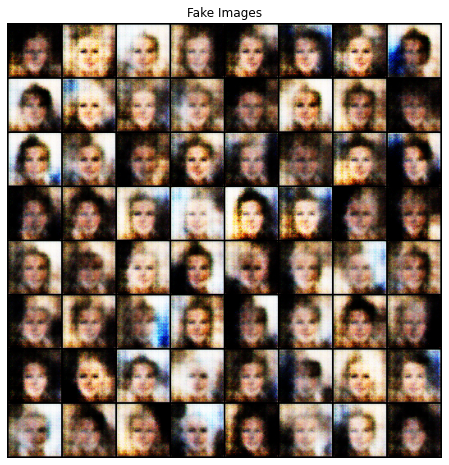

Epoch [2/15] Loss_D: 0.7179, Loss_G: 3.9908, D(x): 0.8597, D(G(z)): 0.2840


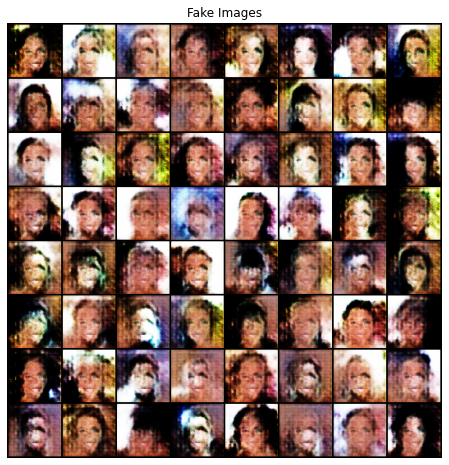

Epoch [3/15] Loss_D: 0.6658, Loss_G: 4.1867, D(x): 0.8634, D(G(z)): 0.2692


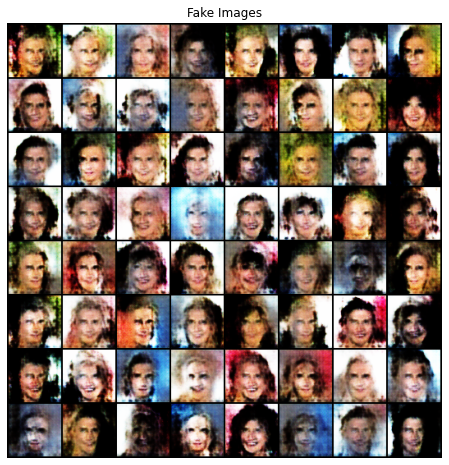

Epoch [4/15] Loss_D: 0.6694, Loss_G: 4.3261, D(x): 0.8651, D(G(z)): 0.2679


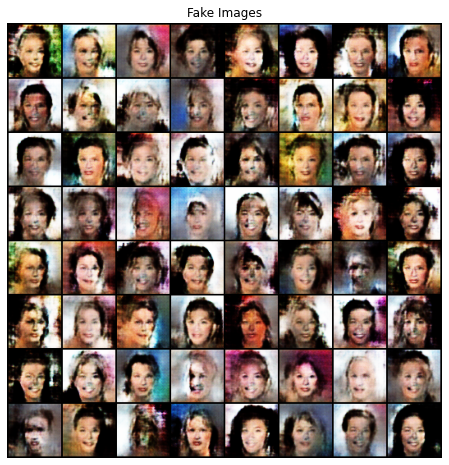

Epoch [5/15] Loss_D: 0.6442, Loss_G: 4.2267, D(x): 0.8686, D(G(z)): 0.2597


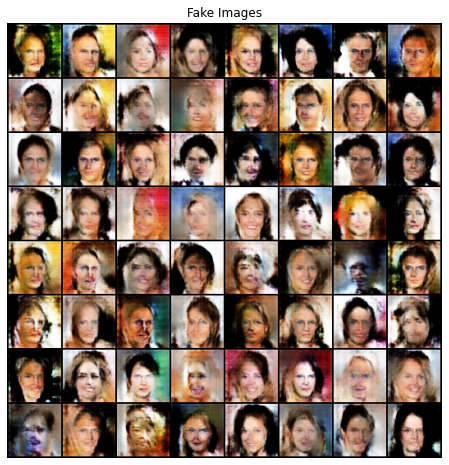

Epoch [6/15] Loss_D: 0.6380, Loss_G: 4.2199, D(x): 0.8720, D(G(z)): 0.2538


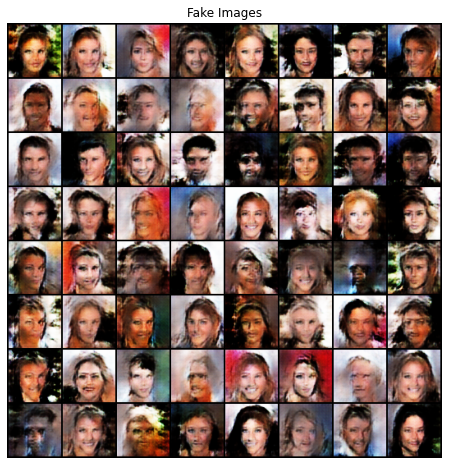

Epoch [7/15] Loss_D: 0.6282, Loss_G: 4.0991, D(x): 0.8733, D(G(z)): 0.2513


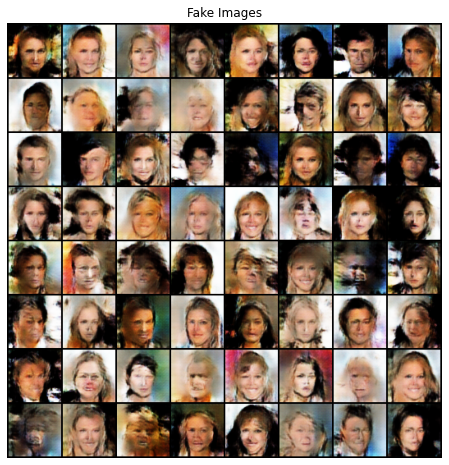

Epoch [8/15] Loss_D: 0.6442, Loss_G: 4.1100, D(x): 0.8732, D(G(z)): 0.2508


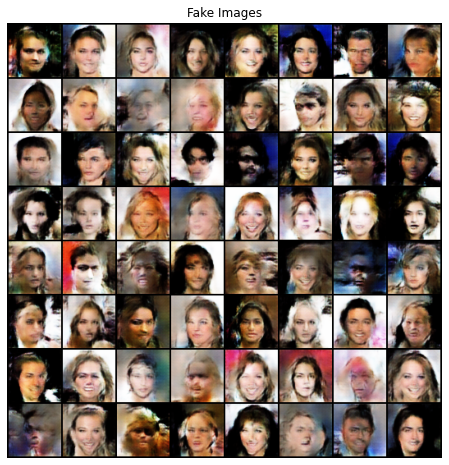

Epoch [9/15] Loss_D: 0.6406, Loss_G: 3.9539, D(x): 0.8749, D(G(z)): 0.2498


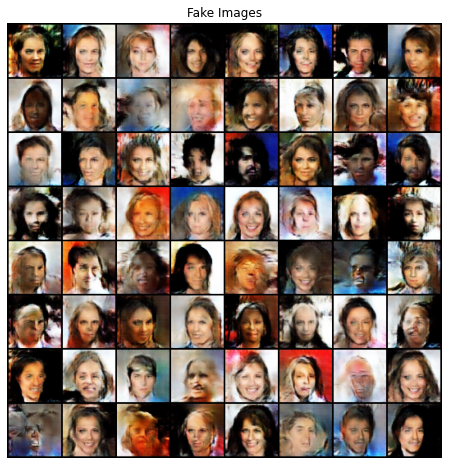

Epoch [10/15] Loss_D: 0.5751, Loss_G: 4.1443, D(x): 0.8806, D(G(z)): 0.2373


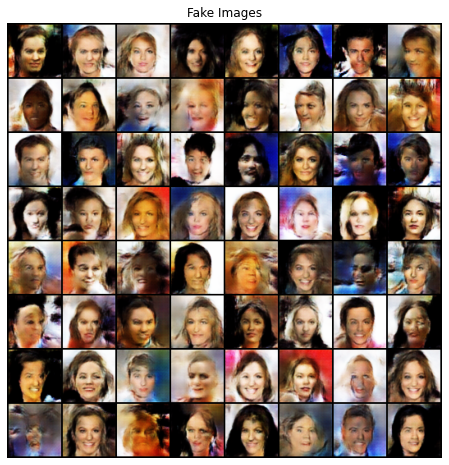

Epoch [11/15] Loss_D: 0.6080, Loss_G: 4.0264, D(x): 0.8810, D(G(z)): 0.2371


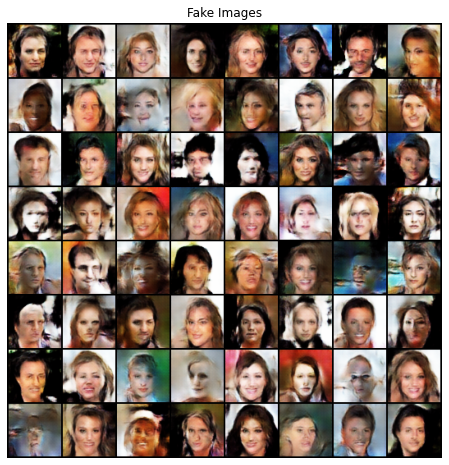

Epoch [12/15] Loss_D: 0.6672, Loss_G: 3.8145, D(x): 0.8741, D(G(z)): 0.2509


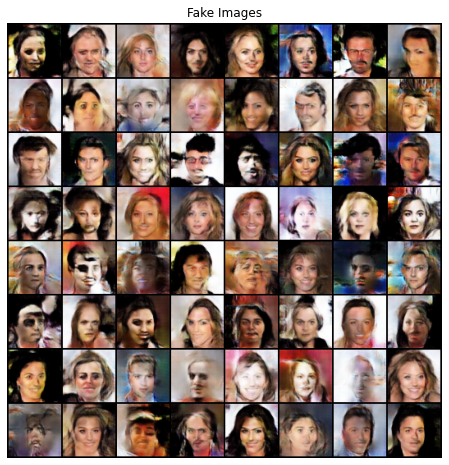

Epoch [13/15] Loss_D: 0.5663, Loss_G: 4.0656, D(x): 0.8878, D(G(z)): 0.2237


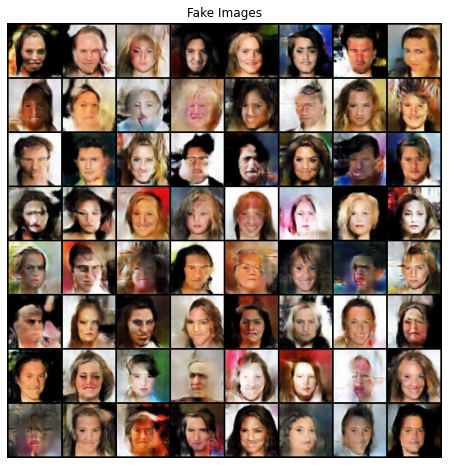

Epoch [14/15] Loss_D: 0.5386, Loss_G: 4.0383, D(x): 0.8940, D(G(z)): 0.2083


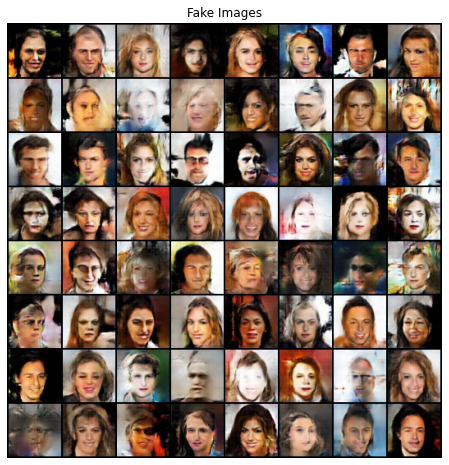

Epoch [15/15] Loss_D: 0.6353, Loss_G: 4.0472, D(x): 0.8816, D(G(z)): 0.2378


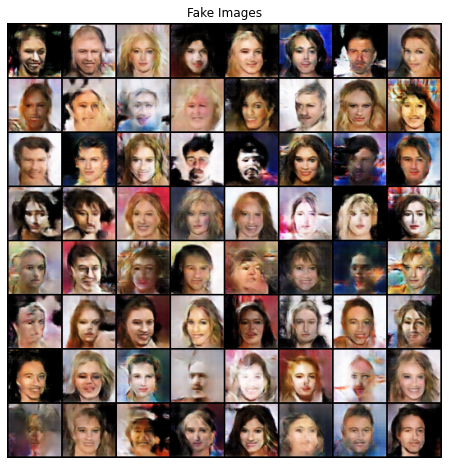

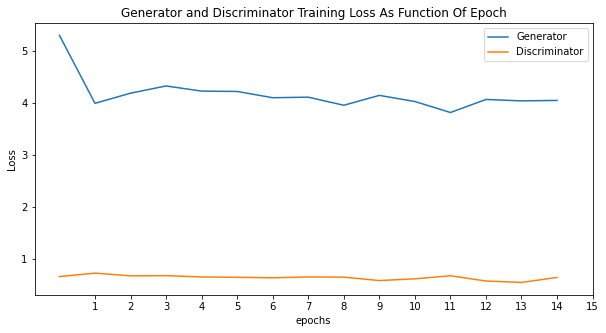

In [28]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Subset
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt

# Define your optimizers
gen_optimizer = optim.Adam(generator.parameters(), lr=0.0002, betas=(0.5, 0.999))
discriminator_optimizer = optim.Adam(discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))

num_epochs = 15
total_num_images = 202598  # For random selection
images_per_epoch = 20000

def save_model(model, optimizer, epoch, filename_prefix="bigger_GAN_model" ):
   
    filename = f"{filename_prefix}_{epoch}.pkl"
    torch.save({
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'epoch': epoch,  # It might be useful to also save the epoch number if you need it
    }, filename)
    
#train loop

# For plotting losses
G_losses = []
D_losses = []

# Fixed noise for generating images after each epoch
fixed_noise = torch.randn(64, latent_dim, 1, 1, device=device)

for epoch in range(num_epochs):
    D_epoch_losses = []
    G_epoch_losses = []
    D_x_values = []  # Store D(x) values
    D_G_z_values = []  # Store D(G(z)) values

    # Select random subset of images for this epoch
    indices = torch.randperm(len(train_loader.dataset))[:total_num_images]
    subset_data_loader = DataLoader(Subset(train_loader.dataset, indices), batch_size=train_loader.batch_size, shuffle=True)
    
    for i, (images, _) in enumerate(subset_data_loader):
        if i >= images_per_epoch // images.size(0):
            break
        
        real_images = images.to(device)
        batch_size = real_images.size(0)
        real_labels = torch.full((batch_size,), 1., dtype=torch.float, device=device)
        fake_labels = torch.full((batch_size,), 0., dtype=torch.float, device=device)
        

        ####
        discriminator_optimizer.zero_grad()
        output = discriminator(real_images)
        errD_real = criterion(output, real_labels)
        errD_real.backward()

        D_x = output.mean().item()
        discriminator_optimizer.step()
        
        noise = torch.randn(batch_size, latent_dim, 1, 1, device=device)
        fake_images = generator(noise)
        output = discriminator(fake_images.detach())
        errD_fake = criterion(output, fake_labels)
        
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        
        discriminator_optimizer.step()
        
        # Train Generator
        generator.zero_grad()
        output = discriminator(fake_images)
        errG = criterion(output, real_labels)
        errG.backward()
        gen_optimizer.step()
        
        D_epoch_losses.append(errD_real.item() + errD_fake.item())
        G_epoch_losses.append(errG.item())
        D_x_values.append(D_x)
        D_G_z_values.append(D_G_z1)

    # Record epoch losses for plotting
    D_losses.append(np.mean(D_epoch_losses))
    G_losses.append(np.mean(G_epoch_losses))

    print(f'Epoch [{epoch+1}/{num_epochs}] Loss_D: {np.mean(D_epoch_losses):.4f}, Loss_G: {np.mean(G_epoch_losses):.4f}, D(x): {np.mean(D_x_values):.4f}, D(G(z)): {np.mean(D_G_z_values):.4f}')

    # Generate and display images from fixed noise after each epoch
    with torch.no_grad():
        fake_images = generator(fixed_noise).detach().cpu()
    plt.figure(figsize=(8,8))
    plt.axis("off")
    plt.title("Fake Images")
    plt.imshow(np.transpose(vutils.make_grid(fake_images, padding=2, normalize=True),(1,2,0)))
    plt.show()
    
    # Optionally, save the model
    save_model(generator, gen_optimizer, epoch, filename_prefix="Generator_model_epoch")
    save_model(discriminator, discriminator_optimizer, epoch, filename_prefix="Discriminator_model_epoch")

# After all epochs, plot losses
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Training Loss As Function Of Epoch")
plt.plot(G_losses,label="Generator")
plt.plot(D_losses,label="Discriminator")
plt.xlabel("epochs")
plt.ylabel("Loss")
plt.xticks(range(1, num_epochs+1))
plt.legend()
plt.show()


# Reproduce_HW3

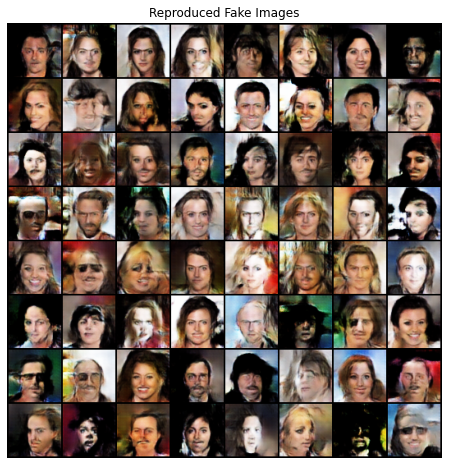

In [62]:
import torch
import matplotlib.pyplot as plt
import torchvision.utils as vutils

def load_model(filepath, model, optimizer=None):
    
    checkpoint = torch.load(filepath, map_location='cpu')
    model.load_state_dict(checkpoint['model_state_dict'])
    if optimizer is not None:
        optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    return checkpoint.get('epoch', 0)

def reproduce_hw3(filepath, generator, latent_dim, device=torch.device("cuda:0" if torch.cuda.is_available() else "cpu")):
   
    # Load the generator model
    load_model(filepath, generator)
    
    # Generate and display images using fixed noise
    fixed_noise = torch.randn(64, latent_dim, 1, 1, device=device)
    generator.eval()
    with torch.no_grad():
        fake_images = generator(fixed_noise).detach().cpu()
    plt.figure(figsize=(8,8))
    plt.axis("off")
    plt.title("Reproduced Fake Images")
    plt.imshow(np.transpose(vutils.make_grid(fake_images, padding=2, normalize=True),(1,2,0)))
    plt.show()

# Example usage:
model_path = r"C:\Users\USER\Desktop\תרגילי בית להגשה\סמסטר ה\למידה חישובית 2\שיעורי בית להגשה\HW3\Generator_model_epoch_11.pkl"

reproduce_hw3(model_path, generator, latent_dim)


# Output visualization- Explore variations of latent space

 D(G(z)): 0.1627


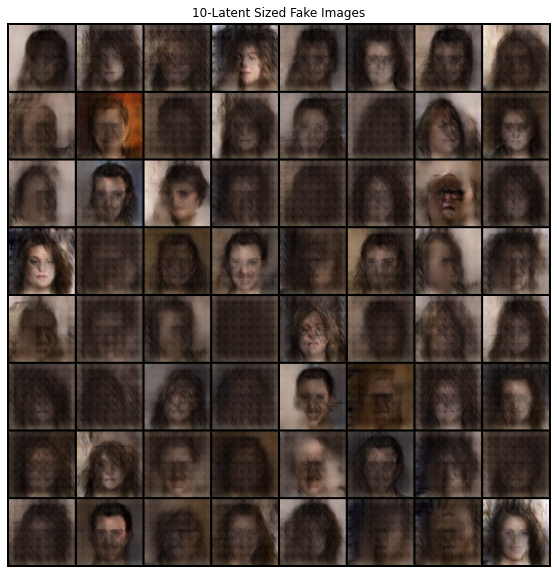

 D(G(z)): 0.1468


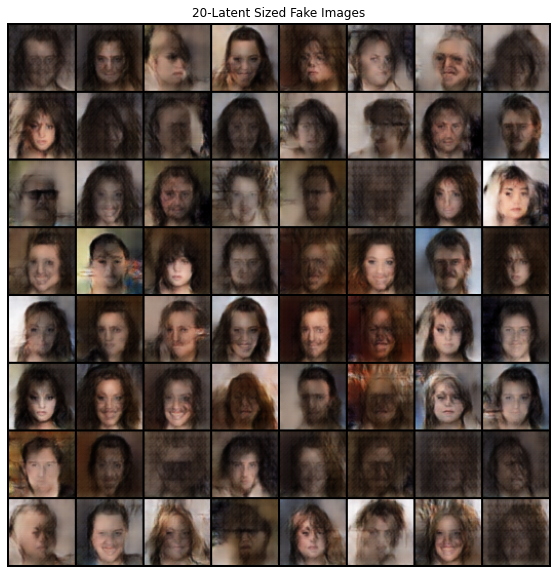

 D(G(z)): 0.2063


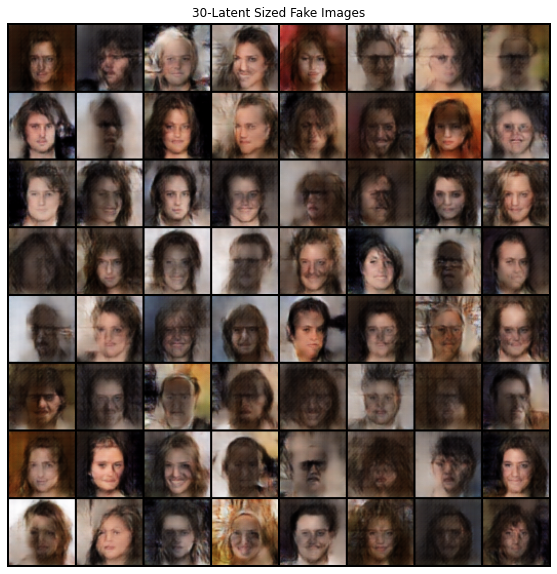

 D(G(z)): 0.2083


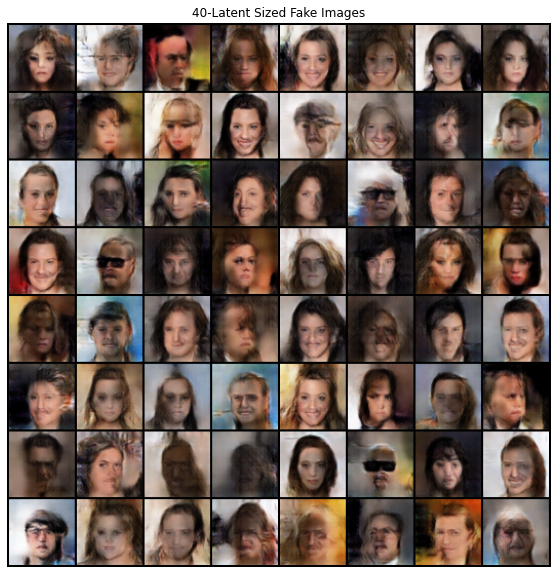

 D(G(z)): 0.2394


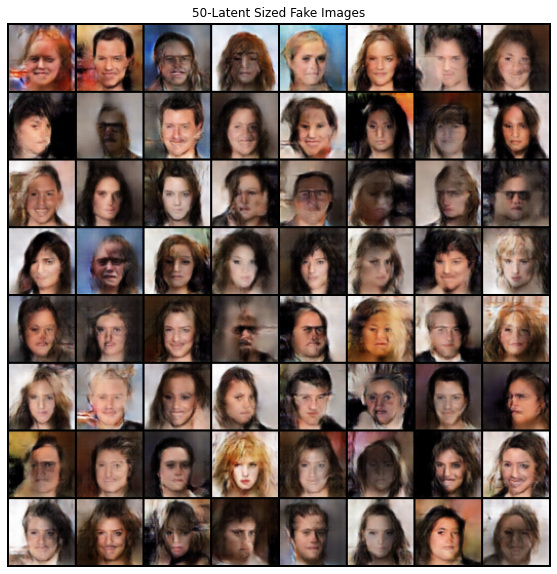

 D(G(z)): 0.2627


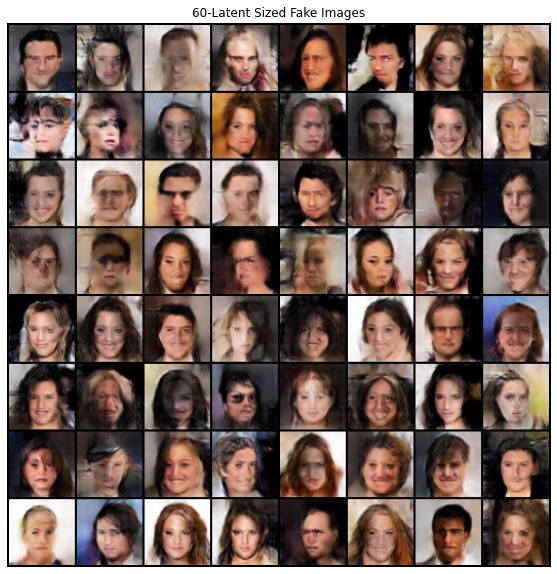

 D(G(z)): 0.3129


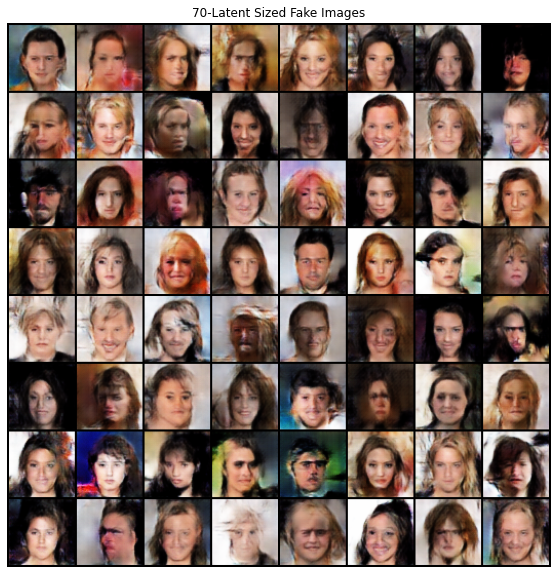

 D(G(z)): 0.3125


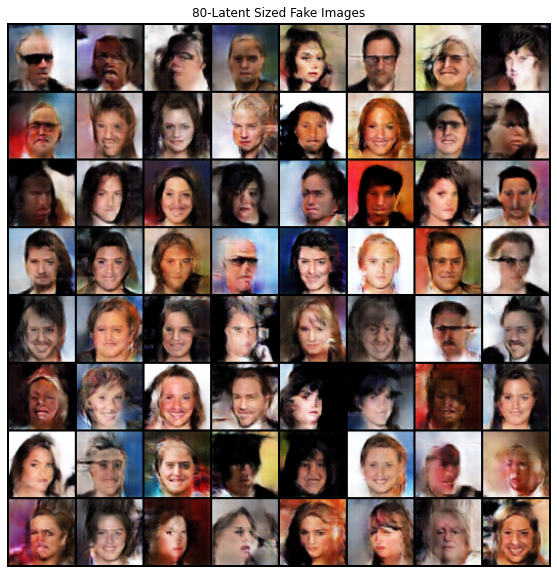

 D(G(z)): 0.3234


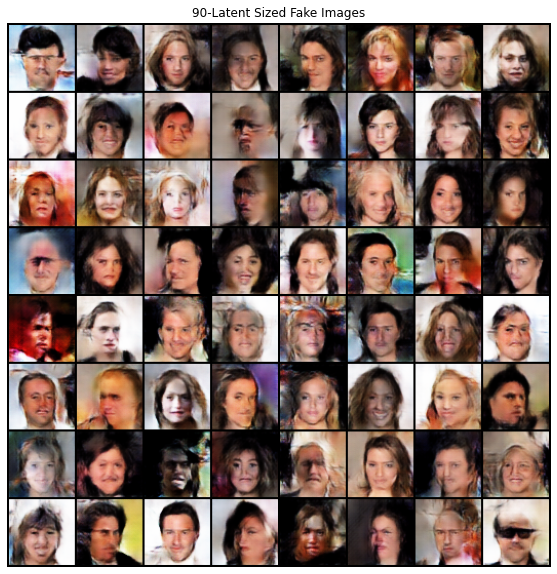

 D(G(z)): 0.4165


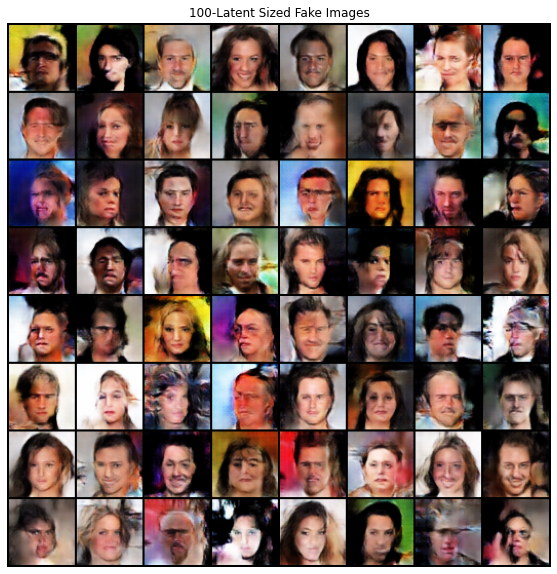

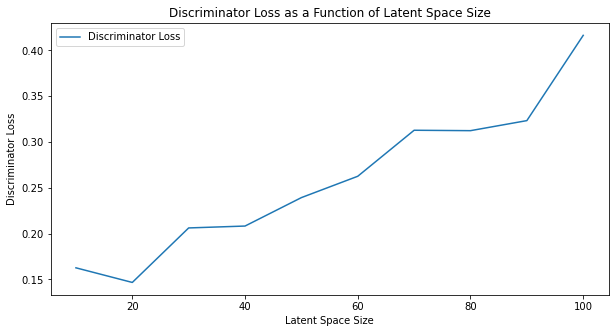

In [75]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import torchvision.utils as vutils

def latent_space_diff(model_path, generator, discriminator, criterion, latents = range(10, 101, 10), device=torch.device("cuda:0" if torch.cuda.is_available() else "cpu")):
    # Load the generator model weights
    generator.load_state_dict(torch.load(model_path, map_location=device)['model_state_dict'])
    model_path_2 = r"C:\Users\USER\Desktop\תרגילי בית להגשה\סמסטר ה\למידה חישובית 2\שיעורי בית להגשה\HW3\Discriminator_model_epoch_12.pkl"
    discriminator.load_state_dict(torch.load(model_path_2, map_location=device)['model_state_dict'])
    generator.eval()  # Ensure the generator is in evaluation mode
    discriminator.eval()  # Ensure the discriminator is also in evaluation mode

    losses = []

    for latent in latents:
        # Generate noise with varying information density
        effective_noise = torch.randn(64, latent, 1, 1, device=device)
        padding = torch.zeros(64, 100 - latent, 1, 1, device=device)
        full_noise = torch.cat((effective_noise, padding), 1)

        with torch.no_grad():
            fake_images = generator(full_noise)
            # Fake labels setup (all zeros because these are fake images)
            fake_labels = torch.zeros(64, device=device)  # Assuming a batch size of 64

            # Calculate discriminator loss for fake images
            #output = D(fake_images.detach())
            output = discriminator(fake_images)

            loss = criterion(output, fake_labels)
            print(f' D(G(z)): {loss:.4f}')

            
        
        losses.append(loss.item())

        # Display generated images for this latent space size
        plt.figure(figsize=(10, 10))
        plt.axis("off")
        plt.title(f"{latent}-Latent Sized Fake Images")
        plt.imshow(np.transpose(vutils.make_grid(fake_images[:64], padding=2, normalize=True).cpu(), (1, 2, 0)))
        plt.show()

    # After displaying all images, plot the loss graph
    plt.figure(figsize=(10, 5))
    plt.plot(latents, losses, label="Discriminator Loss")
    plt.xlabel("Latent Space Size")
    plt.ylabel("Discriminator Loss")
    plt.title("Discriminator Loss as a Function of Latent Space Size")
    plt.legend()
    plt.show()


model_path = r"C:\Users\USER\Desktop\תרגילי בית להגשה\סמסטר ה\למידה חישובית 2\שיעורי בית להגשה\HW3\Generator_model_epoch_12.pkl"

# Now, call the function with all required arguments including G, D, and criterion
# Note: Ensure the function `explore_latent_space_variation` is updated to accept these parameters and to perform operations as discussed
latent_space_diff(model_path, generator, discriminator, criterion, device=device)

In [76]:
pip freeze > requirements.txt

Note: you may need to restart the kernel to use updated packages.
